<a href="https://colab.research.google.com/github/sairahash/Restaurant-data-analysis/blob/main/cognifyz_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns


In [2]:
df=pd.read_csv(r"Dataset .csv")

In [3]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [4]:
def BasicEDA(df):
    print(f"First 5 Row of dataframe is \n{df.head()}")
    print("=======================================\n")
    print(f"List of columns in dataframe is {df.columns}")
    print("=======================================\n")
    print(f"The shape of dataframe is {df.shape}")
    print("=======================================\n")
    print(f"Description about dataframe Numerical columns :\n{df.describe()}")
    print("=======================================\n")
    print(f"Description about dataframe Categorical columns :\n{df.describe(include='O')}")
    print("=======================================\n")
    print(f"Information about the data type of the dataframe : \n{df.info()}")
    print("=======================================\n")
    print(f"Number of nullvalues in dataframe is \n{df.isnull().sum()}")
    print("=======================================\n")
    print(f"Information about  duplicated rows :\n {df[df.duplicated()]}")
    print(f"{df.duplicated().sum()}  rows are duplicated")

BasicEDA(df)

First 5 Row of dataframe is 
   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, M

From the first insight from the dataset,we can observe that there are 9551 rows and 21 columns, in which 8 columns are numerical variable and 13 columns are numerical vaiables.There are 9 null values in Cuisine feature and zero duplicated rows

**LEVEL 1**


**Task 1: Top Cuisines**

### 1) Determine the top three most common cuisines in the dataset.






In [5]:
df['Cuisines'].value_counts()

,count
Cuisines,
North Indian,936
"North Indian, Chinese",511
Chinese,354
Fast Food,354
"North Indian, Mughlai",334
...,...
"Bengali, Fast Food",1
"North Indian, Rajasthani, Asian",1
"Chinese, Thai, Malaysian, Indonesian",1


In [6]:
df['Cuisines'].isnull().sum()

9

From the above information we can see that there are 9 null values for Cuisines.

In [7]:
#Imputing missing value
df['Cuisines'].fillna(df['Cuisines'].mode()[0],inplace=True)


<ipython-input-7-021daee42510>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Cuisines'].fillna(df['Cuisines'].mode()[0],inplace=True)


In [8]:
df['Cuisines'].isnull().sum()

0

In [9]:
top3_cuisines=df['Cuisines'].str.split(',').explode().value_counts().head(3)
print(f'The top 3 most common cuisine is :{top3_cuisines}')

The top 3 most common cuisine is :Cuisines
North Indian    3001
 Chinese        1880
 Fast Food      1314
Name: count, dtype: int64


North Indian,chinese, Fast food  are the top 3 cuisines in the dataset

####2) Calculate the percentage of restaurants that serve each of the top cuisines

In [10]:
df['Restaurant Name'].value_counts().head(10)

,count
Restaurant Name,
Cafe Coffee Day,83
Domino's Pizza,79
Subway,63
Green Chick Chop,51
McDonald's,48
Keventers,34
Pizza Hut,30
Giani,29
Baskin Robbins,28


In [11]:
total_restaurant=df['Restaurant Name'].shape[0]
per_restaurant=top3_cuisines/total_restaurant*100
per_restaurant

,count
Cuisines,
North Indian,31.420794
Chinese,19.683803
Fast Food,13.757722


31.42% of restaurants serve North Indian cuisines,
19.68% restaurants serve chinese cuisines and
13.75% of retaurants serve fast food

##**Task** **2: City Analysis**

1)Identify the city with the highest number
of restaurants in the dataset.




In [51]:
city_count=df['City'].value_counts().head()
print(f' City with the highest number of restaurants :{city_count}')

 City with the highest number of restaurants :City
New Delhi    5473
Gurgaon      1118
Noida        1080
Faridabad     251
Ghaziabad      25
Name: count, dtype: int64


Text(0.5, 1.0, 'Top 5 cities with high number of restaurants')

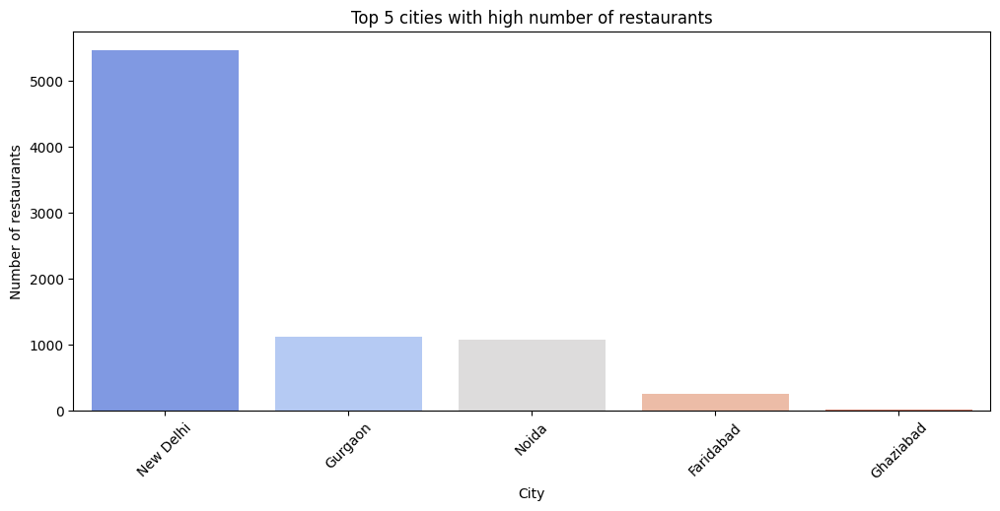

In [52]:
plt.figure(figsize=(12,5))
sns.barplot(x=city_count.index,y=city_count.values,hue=city_count.index,palette='coolwarm')
plt.xticks(rotation=45)
plt.xlabel('City')
plt.ylabel('Number of restaurants')
plt.title('Top 5 cities with high number of restaurants')

New Delhi,Gurgaon,Noida are the cities having highest number of restaurants

2) Calculate the average rating for
restaurants in each city.

In [13]:
avg_rate=df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print(f'The average rating for restaurants in each city :{avg_rate}')

The average rating for restaurants in each city :City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 141, dtype: float64


Above shows the average rating of reaturant in each city.


3) Determine the city with the highest
average rating.

In [14]:
avg_rate_city=df.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False).index[0]
print(f'The highest average rating is: {avg_rate.max()}')
print(f'The city with highest average rating is :{avg_rate_city}')

The highest average rating is: 4.9
The city with highest average rating is :Inner City


InnerCity has the highest rating

**Task 3: Price Range Distribution**

1) Create a histogram or bar chart to
visualize the distribution of price ranges
among the restaurants.



Restaurant Name
10 Downing Street          3.5
#Dilliwaala6               3.0
'Ohana                     3.0
#45                        2.0
#OFF Campus                2.0
#Urban Caf��               2.0
#hashtag                   2.0
10 To 10 In Delhi          2.0
11th Avenue Cafe Bistro    2.0
#InstaFreeze               1.0
Name: Price range, dtype: float64


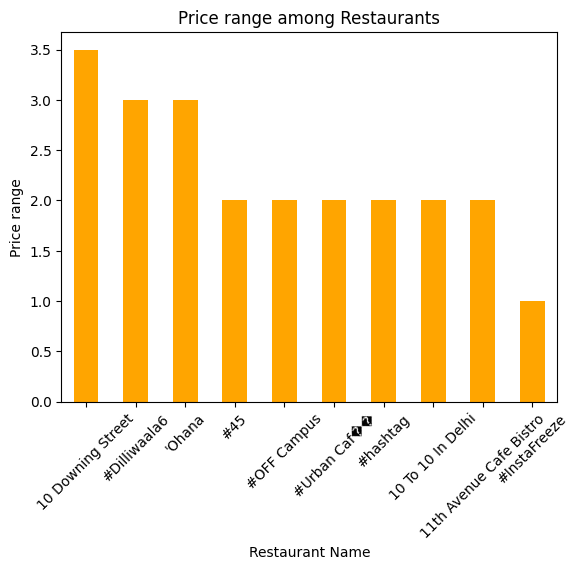

In [15]:
import seaborn as sns

top_10_rest=df.groupby('Restaurant Name')['Price range'].mean().head(10).sort_values(ascending=False)
print(top_10_rest)
top_10_rest.plot(kind='bar',color='orange')
plt.title('Price range among Restaurants')
plt.xlabel('Restaurant Name')
plt.ylabel('Price range')
plt.xticks(rotation=45)
plt.show()



2) Calculate the percentage of restaurants
in each price range category.

In [16]:
df['Price range'].value_counts()
Restaurant_per=df['Price range'].value_counts()/total_restaurant*100
print(f'The percentage of restaurants in each price range :{Restaurant_per}')

The percentage of restaurants in each price range :Price range
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: count, dtype: float64


Around 46.5% of retaurants fall into price range 1(most affordable).
32.59% of the restaurants fall into Price Range 2 (moderately priced).
14.74% of the restaurants fall into Price Range 3 (expensive).
6.13% of the restaurants fall into Price Range 4 (luxury or very high-end)

##**Task 4: Online Delivery**

1) Determine the percentage of restaurants
that offer online delivery.



In [17]:
df['Has Online delivery'].value_counts()

,count
Has Online delivery,
No,7100
Yes,2451


In [18]:

Restaurant_onl=df['Has Online delivery'].value_counts()/total_restaurant*100
print(Restaurant_onl)
online_rest=Restaurant_onl.get('Yes')
print(f'The percentage of reataurants that offer online delivery : {online_rest}')

Has Online delivery
No     74.337766
Yes    25.662234
Name: count, dtype: float64
The percentage of reataurants that offer online delivery : 25.662234321013504


Around 25.66% of restaurant offer online delivery

2) Compare the average ratings of restaurants
with and without online delivery.

In [19]:
avg_rate_onl=df.groupby('Has Online delivery')['Aggregate rating'].mean().sort_values(ascending=False)
rest_withonline=avg_rate_onl.get('Yes')
print(f'The average rating of reataurants offering online delivery :{rest_withonline}')
rest_withoutonline=avg_rate_onl.get('No')
print(f'The average rating of reataurants offering online delivery :{rest_withoutonline}')

The average rating of reataurants offering online delivery :3.2488372093023252
The average rating of reataurants offering online delivery :2.465295774647887


Restaurants offering online delivery tend to have higher rating.

##LEVEL 1 COMPLETED

#LEVEL 2

##Task 1: Restaurant Ratings

1 )Analyze the distribution of aggregate
ratings and determine the most common
rating range.



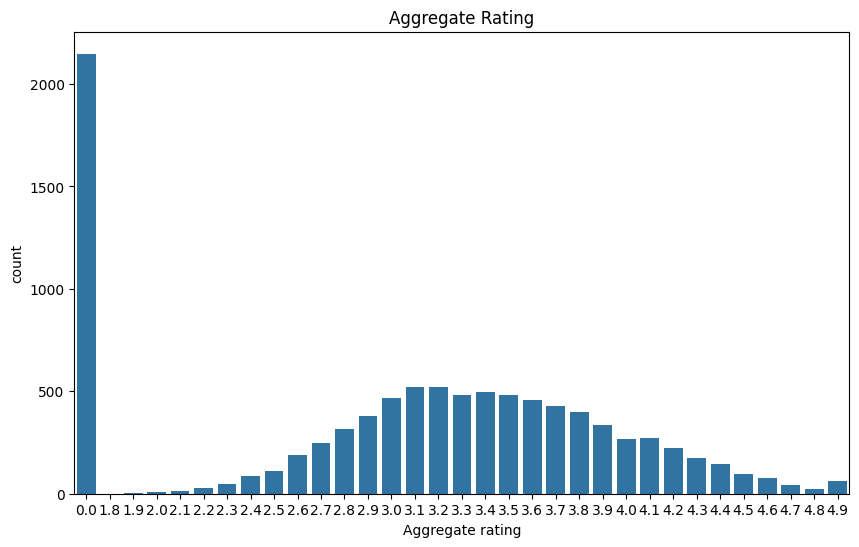

In [20]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Aggregate rating', data=df)
plt.title('Aggregate Rating')
plt.show()

In [21]:
most_common_rate=df['Aggregate rating'].value_counts().sort_values(ascending=False).index[0]
#we can either use idxmax to get the most common rating from the dataset
print(f"The most common rating range: {most_common_rate}")

The most common rating range: 0.0


2) Calculate the average number of votes
received by restaurants.

In [22]:
df['Votes'].value_counts()

,count
Votes,
0,1094
1,483
2,327
3,244
4,207
...,...
615,1
538,1
823,1


In [23]:
restuarant_votes=df.groupby('Restaurant Name')['Votes'].mean().sort_values(ascending=False)
print(f'The average number of votes received by restaurants :{restuarant_votes.head(10)}')

The average number of votes received by restaurants :Restaurant Name
Toit                10934.0
Hauz Khas Social     7931.0
Peter Cat            7574.0
Big Brewsky          5705.0
The Black Pearl      5385.0
BarBQ                5288.0
Warehouse Cafe       4914.0
Truffles             4841.0
Mocambo              4464.0
Gulati               4373.0
Name: Votes, dtype: float64


##Task 2: Cuisine Combination

1) Identify the most common combinations of
cuisines in the dataset.



In [24]:
df['Cuisines']

,Cuisines
0,"French, Japanese, Desserts"
1,Japanese
2,"Seafood, Asian, Filipino, Indian"
3,"Japanese, Sushi"
4,"Japanese, Korean"
...,...
9546,Turkish
9547,"World Cuisine, Patisserie, Cafe"
9548,"Italian, World Cuisine"
9549,Restaurant Cafe


In [25]:
combination_cuisine=df[df['Cuisines'].str.contains(',')]
combination_cuisine['Cuisines']
print(f"The combination cuisines are :\n {combination_cuisine['Cuisines']}")
most_common_comb=combination_cuisine['Cuisines'].value_counts().head(3)
print(f"\nThe most common combination cuisine are :\n {most_common_comb}")


The combination cuisines are :
 0               French, Japanese, Desserts
2         Seafood, Asian, Filipino, Indian
3                          Japanese, Sushi
4                         Japanese, Korean
6                          Asian, European
                       ...                
9541    Restaurant Cafe, Turkish, Desserts
9544                      Desserts, B�_rek
9545                        Burger, Izgara
9547       World Cuisine, Patisserie, Cafe
9548                Italian, World Cuisine
Name: Cuisines, Length: 6148, dtype: object

The most common combination cuisine are :
 Cuisines
North Indian, Chinese             511
North Indian, Mughlai             334
North Indian, Mughlai, Chinese    197
Name: count, dtype: int64


2) Determine if certain cuisine combinations
tend to have higher ratings.

In [42]:
cuisine_comb_high=combination_cuisine.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=False)
print(f'The cuisine combinations with higher rating :')
print(cuisine_comb_high.head(3))

The cuisine combinations with higher rating :
Cuisines
Italian, Deli          4.9
Continental, Indian    4.9
Hawaiian, Seafood      4.9
Name: Aggregate rating, dtype: float64


Yes!!These cuisine combinations tend to have high rating.
Italian, Deli  | Continental, Indian| Hawaiian, Seafood  are the cuisine combinations found to be most common and high rating

##Task 3: Geographic Analysis

1)Plot the locations of restaurants on a
map using longitude and latitude
coordinates.



In [43]:
import folium
#create map centered to the mean latitude and longitude
m=folium.Map(location=[df['Latitude'].mean(),df['Longitude'].mean()],zoom_start=10)
#df.iterrows iterates over rows in a dataframe
for index,rest in df.iterrows():

  folium.Marker(
      location=[rest['Latitude'],rest['Longitude']],#Acess latitude and longitude correctly
      popup=rest['Restaurant Name'],# display restaurant name as popup
      icon=folium.Icon(color='red',icon='clustry',prefix='fa')).add_to(m)
display(m)


2)Identify any patterns or clusters of
restaurants in specific areas.

In [28]:
df['Latitude'].describe()

,Latitude
count,9551.000000
mean,25.854381
std,11.007935
min,-41.330428
25%,28.478713
50%,28.570469
75%,28.642758
max,55.976980


In [29]:
df['Longitude'].describe()

,Longitude
count,9551.000000
mean,64.126574
std,41.467058
min,-157.948486
25%,77.081343
50%,77.191964
75%,77.282006
max,174.832089


<ipython-input-30-506284deedeb>:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(x=df['Longitude'], y=df['Latitude'], palette="coolwarm", alpha=0.7)


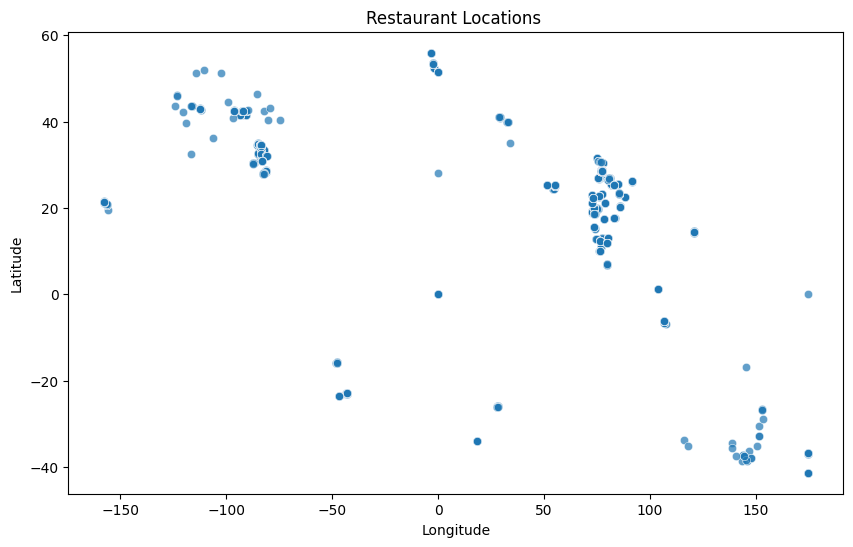

In [30]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Longitude'], y=df['Latitude'], palette="coolwarm", alpha=0.7)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Restaurant Locations ')
plt.show()

There are two dense clusters inthe plot,which could behighly active food zones in a city.Some points are far from the clusters,which indicates restaurants in remote location.

##Task 4: Restaurant Chains

1) Identify if there are any restaurant chains
present in the dataset.



In [31]:
chain_count=df['Restaurant Name'].value_counts()
#Filter for restaurants with more than 1 count
restaurant_chains=chain_count[chain_count>1].head(10)
print(f"The top 10 restaurant chains present in dataset are :\n {restaurant_chains}")

The top 10 restaurant chains present in dataset are :
 Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64


2) Analyze the ratings and popularity of
different restaurant chains.

In [32]:
agg_rating = df.groupby("Restaurant Name")["Aggregate rating"].mean()
restaurant_chain_rating = agg_rating[restaurant_chains.index]
print(restaurant_chain_rating)

Restaurant Name
Cafe Coffee Day     2.419277
Domino's Pizza      2.740506
Subway              2.907937
Green Chick Chop    2.672549
McDonald's          3.339583
Keventers           2.870588
Pizza Hut           3.320000
Giani               2.689655
Baskin Robbins      1.860714
Barbeque Nation     4.353846
Name: Aggregate rating, dtype: float64


In [33]:
vote_rating = df.groupby("Restaurant Name")["Votes"].mean()
restaurant_chain_vote = vote_rating[restaurant_chains.index]
print(restaurant_chain_vote)

Restaurant Name
Cafe Coffee Day       29.253012
Domino's Pizza        84.088608
Subway                97.206349
Green Chick Chop      18.901961
McDonald's           110.229167
Keventers             37.147059
Pizza Hut            165.366667
Giani                 29.448276
Baskin Robbins        15.285714
Barbeque Nation     1082.384615
Name: Votes, dtype: float64


From the top 10 restaurant chains we can find that Barbeque Nation is having high rating and votes compared to other restaurant chains

##LEVEL 2 COMPLETED

#LEVEL 3


#Task 2: Votes Analysis

1)Identify the restaurants with the highest and
lowest number of votes.



In [34]:
restuarant_votes=df.groupby('Restaurant Name')['Votes'].sum().sort_values(ascending=False)
rest_highvote=restuarant_votes.index[0]
print(f"Restaurants with highest number of votes :{rest_highvote}")
rest_lowvote=restuarant_votes.tail(10)
print(f"Restaurants with lowest number of votes :{rest_lowvote.tail(10)}")

Restaurants with highest number of votes :Barbeque Nation
Restaurants with lowest number of votes :Restaurant Name
Hotel Green View Palace    0
Sweetcake.in               0
Hotel Delhi 43             0
TAG                        0
Szoun Chinese Food         0
Muncheezz                  0
Swiss Gourmessa            0
Dosa and Pizza Corner      0
Sweets n Treats            0
Food Station               0
Name: Votes, dtype: int64


2) Analyze if there is a correlation between the
number of votes and the rating of a
restaurant.

In [35]:
correlation_matrix = df['Votes'].corr(df['Aggregate rating'])
print(correlation_matrix)


0.31369058419541157


A correaltion of 0.313 suggests a weak positive correlation between votes and rating of a restaurant.It indicates that as vote increaes rating tend to increase slightly,but the relationship is not strong.

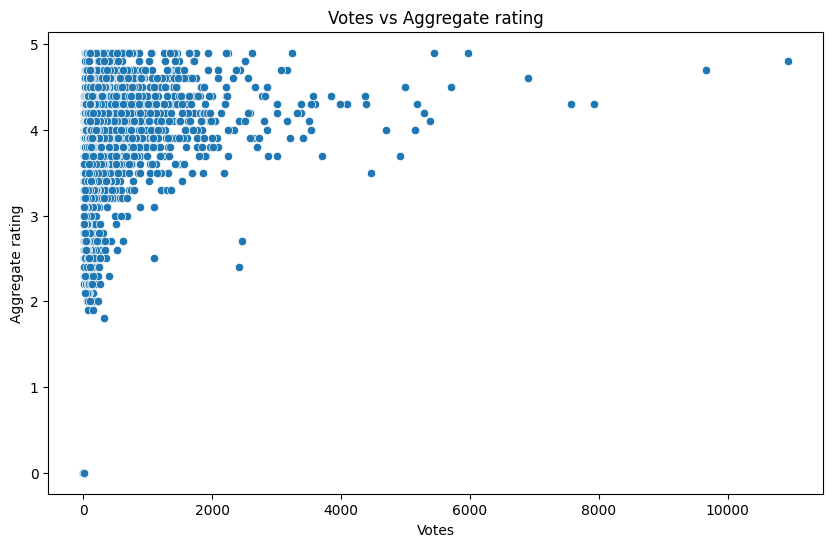

In [36]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Votes'], y=df['Aggregate rating'])
plt.xlabel('Votes')
plt.ylabel('Aggregate rating')
plt.title('Votes vs Aggregate rating')
plt.show()

#####Here we can see a dense cluster at high ratings with few votes.
###### Many points are clustered around ratings of 3.5 to but with fewer votes(left side of X axis)
#####This indicates that many restaurants have high ratings but haven't received many votes

#Task 3: Price Range vs. Online Delivery and Table Booking

1) Analyze if there is a relationship between the
price range and the availability of online
delivery and table booking.



In [37]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
df['Has Table booking']=encoder.fit_transform(df['Has Table booking'])
df['Has Online delivery']=encoder.fit_transform(df['Has Online delivery'])
price_analysis=df.groupby("Price range")[['Has Online delivery','Has Table booking']].mean() * 100
print(price_analysis)

             Has Online delivery  Has Table booking
Price range                                        
1                      15.774077           0.022502
2                      41.310633           7.677482
3                      29.190341          45.738636
4                       9.044369          46.757679


Here restaurants with high price range have more table booking compared to online delivery,on the other hand the restaurants with low price range have more online delivery compared to table booking.

2) Determine if higher-priced restaurants are
more likely to offer these services.

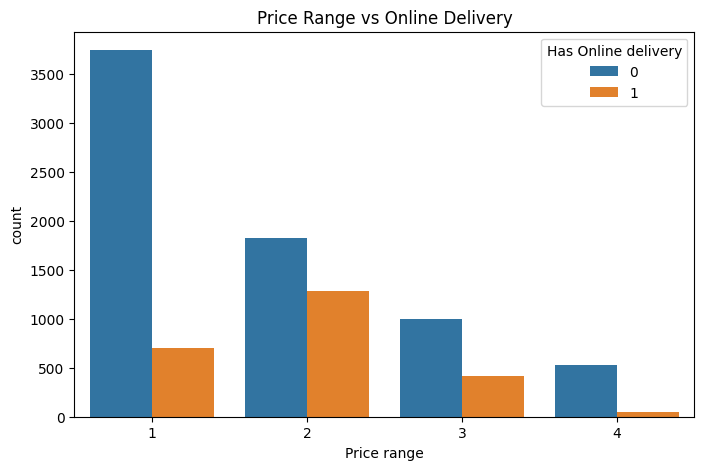

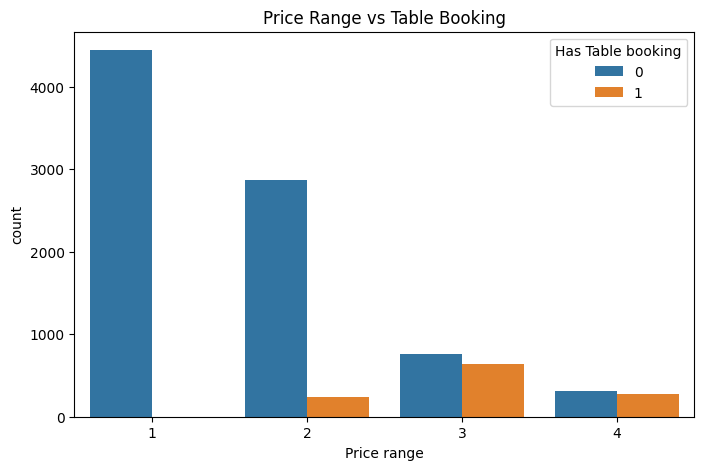

In [38]:
plt.figure(figsize=(8,5))
sns.countplot(x="Price range", hue="Has Online delivery", data=df)
plt.title("Price Range vs Online Delivery")
plt.show()

plt.figure(figsize=(8,5))
sns.countplot(x="Price range", hue="Has Table booking", data=df)
plt.title("Price Range vs Table Booking")
plt.show()

In [39]:
rest_corr=df[['Price range','Has Table booking','Has Online delivery']].corr()
print(f'Correlation between  higher and lower priced restaurant and services :')
print(rest_corr)

Correlation between  higher and lower priced restaurant and services :
                     Price range  Has Table booking  Has Online delivery
Price range             1.000000           0.501925             0.077918
Has Table booking       0.501925           1.000000             0.101224
Has Online delivery     0.077918           0.101224             1.000000


Here ,we can see that higher priced restaurants focus on table booking more and less on online delivery .whereas lower priced restaurants are likely to offer online delivery instead of table service.

##LEVEL 3 COMPLETED